<a href="https://colab.research.google.com/github/lukabozanic/NarodnaNosnjaERP/blob/main/PPPO_LukaaBozanic_IT16_2019.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Tema: Detekcija lica

Predmet: Principi prezentacije i prepoznavanja oblika

Student: Luka Bozanic-IT16-2019




Sadržaj:

Uvod

Dataset

Metode i tehnike za detekciju lica

HaarCascade

HOG karakteristike

MTCNN

Evaluacija rezultata

Zaključak



**Uvod**

Detekcija lica je proces prepoznavanja i lokalizacije lica u digitalnim slikama ili video zapisima. Postoji nekoliko metoda za izvršenje detekcije lica, uključujući tradicionalne tehnike i moderne metode dubokog učenja.
U okviru prepoznavanja lica može se uključiti i prepoznavanje ključnih tačaka.



**Dataset**

Dataset koji mi je dodeljen na temu Detekcija lica u okviru projektnog zadatka  iz predmeta Principi prezentacije i prepoznavanja oblika se sastoji od fotografija poznatih glumaca koje su raspoređene u 5 direktorijuma. Nazivi direktorijuma su imena glumaca čije se slike nalaze unutar njih.
U nastavku projekta potrebno je preuzeti dati dataset i raspakovati ga kako bi se mogla detektovati lica na slikama.

In [ ]:
#Instaliranje biblioteke kako bi se preuzele datoteke sa Google Drive-a
!pip install gdown

In [ ]:
#Uvoz gdown modula
import gdown

In [ ]:
#Preuzimanje datoteke sa Google Drive-a
!gdown --fuzzy https://drive.google.com/file/d/1poBLVBGNteXhgMVDO2vo9XxpXDsTeUK6/view?pli=1

Downloading...
From (original): https://drive.google.com/uc?id=1poBLVBGNteXhgMVDO2vo9XxpXDsTeUK6
From (redirected): https://drive.google.com/uc?id=1poBLVBGNteXhgMVDO2vo9XxpXDsTeUK6&confirm=t&uuid=5be217fd-bd29-479e-a75f-c22b234ad960
To: /content/AVENGERS_FaceDetection.zip
100% 57.2M/57.2M [00:00<00:00, 80.4MB/s]


In [ ]:
#Raspakivanje datoteke sa slikama glumaca
!unzip AVENGERS_FaceDetection.zip

Archive:  AVENGERS_FaceDetection.zip
  inflating: cropped_images/chris_evans/chris_evans1.png  
  inflating: cropped_images/chris_evans/chris_evans10.png  
  inflating: cropped_images/chris_evans/chris_evans11.png  
  inflating: cropped_images/chris_evans/chris_evans12.png  
  inflating: cropped_images/chris_evans/chris_evans13.png  
  inflating: cropped_images/chris_evans/chris_evans14.png  
  inflating: cropped_images/chris_evans/chris_evans15.png  
  inflating: cropped_images/chris_evans/chris_evans16.png  
  inflating: cropped_images/chris_evans/chris_evans17.png  
  inflating: cropped_images/chris_evans/chris_evans18.png  
  inflating: cropped_images/chris_evans/chris_evans19.png  
  inflating: cropped_images/chris_evans/chris_evans2.png  
  inflating: cropped_images/chris_evans/chris_evans20.png  
  inflating: cropped_images/chris_evans/chris_evans21.png  
  inflating: cropped_images/chris_evans/chris_evans22.png  
  inflating: cropped_images/chris_evans/chris_evans23.png  
  inf

**Metode i tehnike prepoznavanja lica**

Neki od načina koji se izdvajaju za prepoznavanje lica jesu:

Metoda Viola-Jones:

Ova metoda koristi kaskadnu klasifikaciju i adaboost algoritam za detekciju objekata, uključujući lica.Radi na osnovu razlika između svetlih i tamnih piksela na slici. Brza je i efikasna za detekciju lica u realnom vremenu, ali može biti manje precizna od dubokih mreža.


Metode Haar Cascade:

Ove metode koriste Haar-like osobine za identifikaciju i detekciju objekata na slici.
Postoji već unapred obučenih kaskada za detekciju lica koje se mogu koristiti.


Detekcija lica bazirana na histogramu usmerenih gradijenata (HOG):

Ova metoda koristi gradijente piksela na slici kako bi identifikovala konture objekata. Detekcija lica se vrši prepoznavanjem karakterističnih oblika i tekstura.


Kaskadne konvolucijske neuralne mreže (CNN):

Duboke neuralne mreže, posebno CNN-ovi, postale su popularne za detekciju lica.
Mreže se obučavaju na velikim skupovima podataka sa označenim licima.
Poznati modeli kao što su Viola-Jones, MTCNN i Single Shot MultiBox Detector (SSD) koriste se za detekciju lica.

Detekcija lica pomoću biblioteka i alata:

Postoje mnoge biblioteke i alati koji omogućavaju detekciju lica, uključujući OpenCV, dlib, TensorFlow i PyTorch. Ove biblioteke omogućavaju jednostavnu implementaciju detekcije lica bez potrebe za pisanjem kompleksnih algoritama


Korišćenje API-ja za detekciju lica:

Neke kompanije, kao što su Microsoft, Google i Amazon, nude cloud-based API-je za detekciju lica.
Ovi API-ji omogućavaju razvojara da integrišu detekciju lica u svoje aplikacije bez potrebe za dubokim poznavanjem tehnologije.


Izbor metode za detekciju lica zavisi od potreba i resursa projekta. Duboke neuralne mreže često daju najbolje rezultate u mnogim situacijama, ali mogu zahtevati velike količine podataka i računarske resurse za obuku. S druge strane, tradicionalne metode mogu biti brže i manje resursno zahtevne, ali mogu biti manje precizne u određenim uslovima.
Metode koje su odabrane za nastavak rada i detekciju lica su HaarCascade model, zatim HOG karakteristike i MTCNN.

In [ ]:
!pip install mtcnn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 10.1 MB/s eta 0:00:00
ERROR: Operation cancelled by user


In [ ]:
#Importovanje potrebnih biblioteka
import os
import dlib
import cv2
import numpy as np
from matplotlib import pyplot as plt
import pandas as pd


In [ ]:
from google.colab.patches import cv2_imshow

In [ ]:
from PIL import Image

In [ ]:
import time

**HaarCascade**

Haar Cascade model je popularna tehnika za detekciju objekata, uključujući i detekciju lica.
Osnovna ideja je da se koriste Haar funkcije koje su matematički opisane kvadratnim šablonima različitih oblika da bi se identifikovali određeni oblici i strukture u slici.

Po pitanju treninga modela, Haar Cascade model se trenira na velikom skupu pozitivnih i negativnih slika. Pozitivni uzorci sadrže traženi objekat (npr. lica), dok negativni uzorci sadrže slike bez tog objekta.
Tokom treninga, model uči Haar funkcije koje su relevantne za detekciju traženog objekta.
Haar Cascade model se sastoji od kaskade klasifikatora. Svaki klasifikator je odgovoran za identifikaciju određenih karakteristika objekta.
Kaskadna struktura omogućava brzu odbacivanje regiona slike koji ne sadrže traženi objekat.

Haar Cascade modeli su široko korišćeni za detekciju lica, ali se takođe mogu prilagoditi za detekciju drugih objekata kao što su automobili, pešaci, ili razni znakovi i oblici.

Mane ovog modela jesu što Haar Cascade modeli mogu biti ograničeni u preciznosti u odnosu na složenije metode za detekciju objekata, posebno u uslovima niskog osvetljenja ili kod objekata koji su delimično zaklonjeni.
Treniranje modela može biti vremenski zahtevno i zahtevati velike količine podataka.
Biblioteka OpenCV pruža gotove Haar Cascade modele za detekciju lica, očiju, nosa, itd. Ovi modeli se lako mogu koristiti u Pythonu i drugim jezicima.








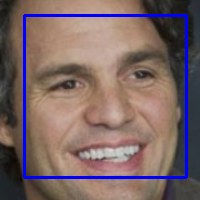

Broj detektovanih lica: 1
Vreme izvršenja: 0.05 sekundi


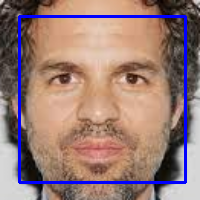

Broj detektovanih lica: 1
Vreme izvršenja: 0.04 sekundi


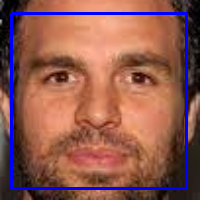

Broj detektovanih lica: 1
Vreme izvršenja: 0.07 sekundi


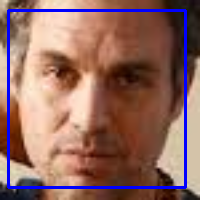

Broj detektovanih lica: 1
Vreme izvršenja: 0.07 sekundi


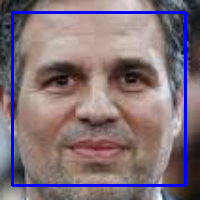

Broj detektovanih lica: 1
Vreme izvršenja: 0.05 sekundi


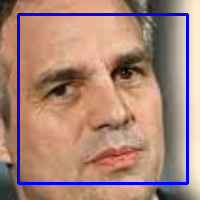

Broj detektovanih lica: 1
Vreme izvršenja: 0.07 sekundi


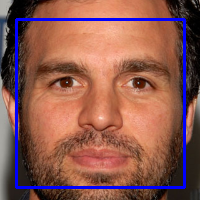

Broj detektovanih lica: 1
Vreme izvršenja: 0.06 sekundi


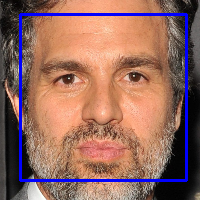

Broj detektovanih lica: 1
Vreme izvršenja: 0.06 sekundi


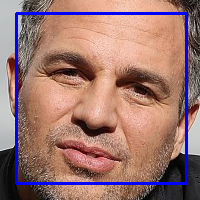

Broj detektovanih lica: 1
Vreme izvršenja: 0.04 sekundi


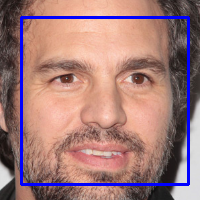

Broj detektovanih lica: 1
Vreme izvršenja: 0.05 sekundi


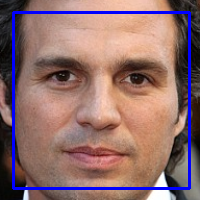

Broj detektovanih lica: 1
Vreme izvršenja: 0.05 sekundi


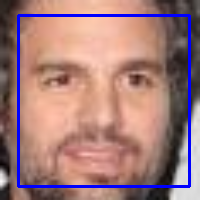

Broj detektovanih lica: 1
Vreme izvršenja: 0.05 sekundi


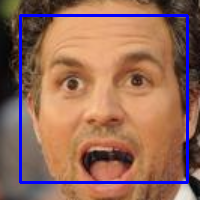

Broj detektovanih lica: 1
Vreme izvršenja: 0.06 sekundi


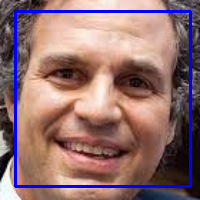

Broj detektovanih lica: 1
Vreme izvršenja: 0.04 sekundi


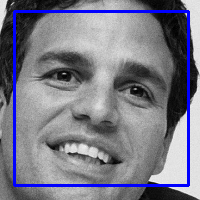

Broj detektovanih lica: 1
Vreme izvršenja: 0.05 sekundi


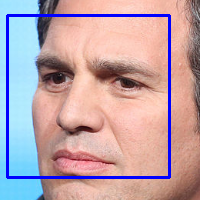

Broj detektovanih lica: 1
Vreme izvršenja: 0.04 sekundi


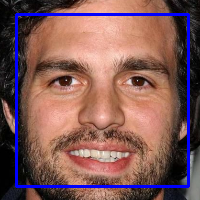

Broj detektovanih lica: 1
Vreme izvršenja: 0.08 sekundi


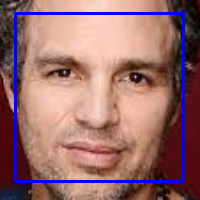

Broj detektovanih lica: 1
Vreme izvršenja: 0.05 sekundi


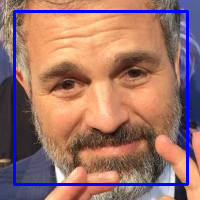

Broj detektovanih lica: 1
Vreme izvršenja: 0.04 sekundi


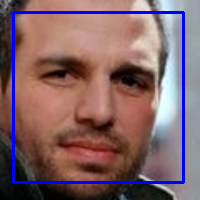

Broj detektovanih lica: 1
Vreme izvršenja: 0.03 sekundi


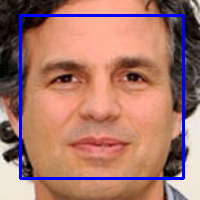

Broj detektovanih lica: 1
Vreme izvršenja: 0.04 sekundi


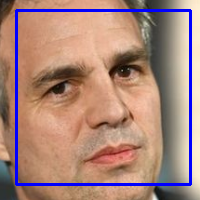

Broj detektovanih lica: 1
Vreme izvršenja: 0.04 sekundi


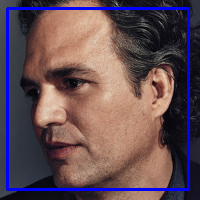

Broj detektovanih lica: 1
Vreme izvršenja: 0.05 sekundi


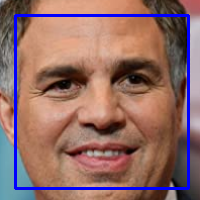

Broj detektovanih lica: 1
Vreme izvršenja: 0.04 sekundi


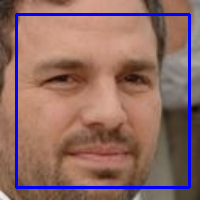

Broj detektovanih lica: 1
Vreme izvršenja: 0.03 sekundi


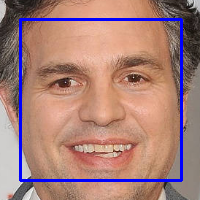

Broj detektovanih lica: 1
Vreme izvršenja: 0.05 sekundi


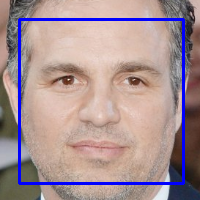

Broj detektovanih lica: 1
Vreme izvršenja: 0.05 sekundi


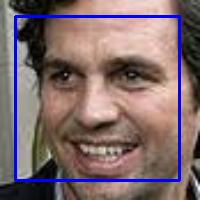

Broj detektovanih lica: 1
Vreme izvršenja: 0.05 sekundi


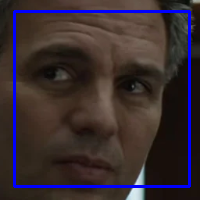

Broj detektovanih lica: 1
Vreme izvršenja: 0.03 sekundi


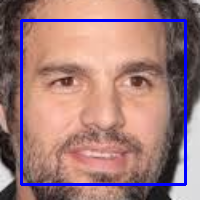

Broj detektovanih lica: 1
Vreme izvršenja: 0.04 sekundi


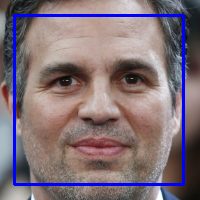

Broj detektovanih lica: 1
Vreme izvršenja: 0.04 sekundi


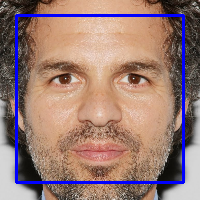

Broj detektovanih lica: 1
Vreme izvršenja: 0.05 sekundi


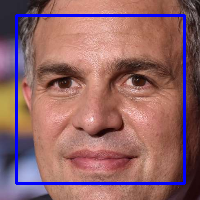

Broj detektovanih lica: 1
Vreme izvršenja: 0.05 sekundi


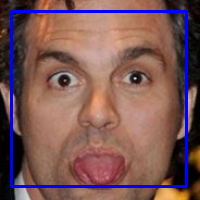

Broj detektovanih lica: 1
Vreme izvršenja: 0.05 sekundi


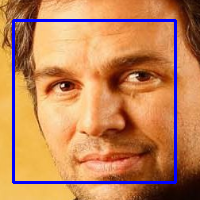

Broj detektovanih lica: 1
Vreme izvršenja: 0.05 sekundi


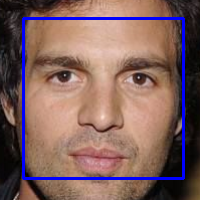

Broj detektovanih lica: 1
Vreme izvršenja: 0.05 sekundi


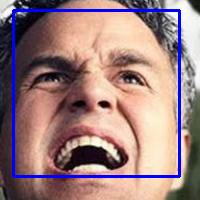

Broj detektovanih lica: 1
Vreme izvršenja: 0.05 sekundi


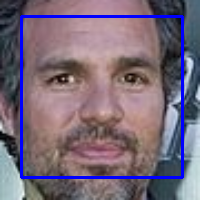

Broj detektovanih lica: 1
Vreme izvršenja: 0.04 sekundi


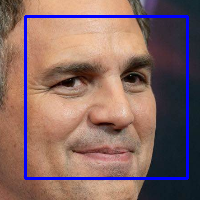

Broj detektovanih lica: 1
Vreme izvršenja: 0.04 sekundi


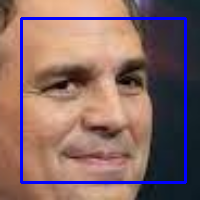

Broj detektovanih lica: 1
Vreme izvršenja: 0.04 sekundi


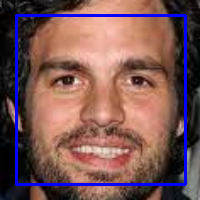

Broj detektovanih lica: 1
Vreme izvršenja: 0.06 sekundi


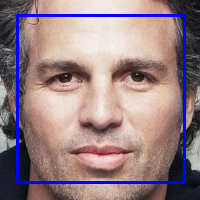

Broj detektovanih lica: 1
Vreme izvršenja: 0.03 sekundi


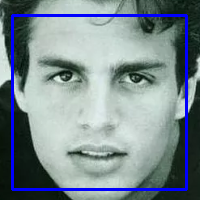

Broj detektovanih lica: 1
Vreme izvršenja: 0.03 sekundi


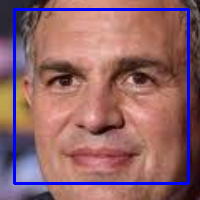

Broj detektovanih lica: 1
Vreme izvršenja: 0.05 sekundi


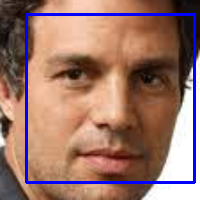

Broj detektovanih lica: 1
Vreme izvršenja: 0.04 sekundi


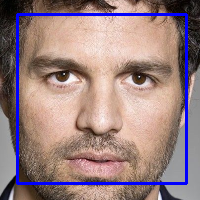

Broj detektovanih lica: 1
Vreme izvršenja: 0.05 sekundi


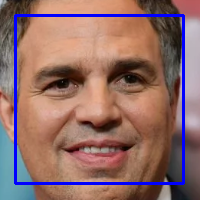

Broj detektovanih lica: 1
Vreme izvršenja: 0.04 sekundi


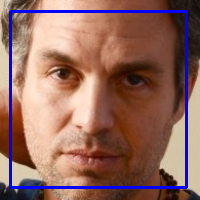

Broj detektovanih lica: 1
Vreme izvršenja: 0.05 sekundi


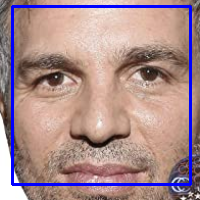

Broj detektovanih lica: 1
Vreme izvršenja: 0.04 sekundi


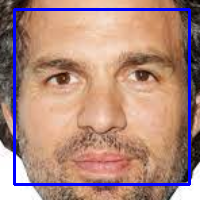

Broj detektovanih lica: 1
Vreme izvršenja: 0.05 sekundi


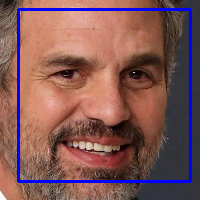

Broj detektovanih lica: 1
Vreme izvršenja: 0.05 sekundi


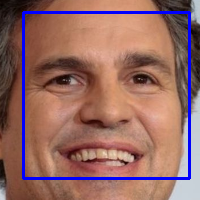

Broj detektovanih lica: 1
Vreme izvršenja: 0.04 sekundi


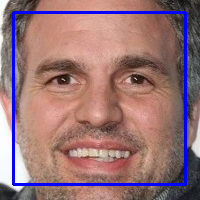

Broj detektovanih lica: 1
Vreme izvršenja: 0.06 sekundi


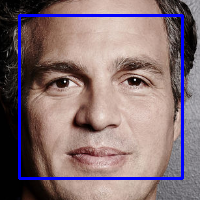

Broj detektovanih lica: 1
Vreme izvršenja: 0.05 sekundi


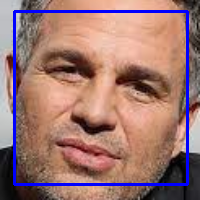

Broj detektovanih lica: 1
Vreme izvršenja: 0.05 sekundi


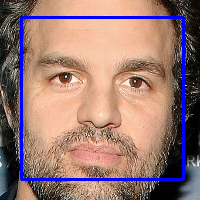

Broj detektovanih lica: 1
Vreme izvršenja: 0.06 sekundi


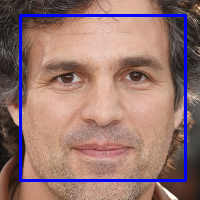

Broj detektovanih lica: 1
Vreme izvršenja: 0.05 sekundi


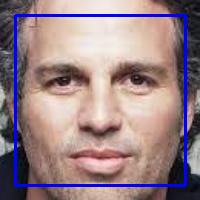

Broj detektovanih lica: 1
Vreme izvršenja: 0.07 sekundi


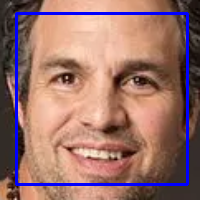

Broj detektovanih lica: 1
Vreme izvršenja: 0.09 sekundi


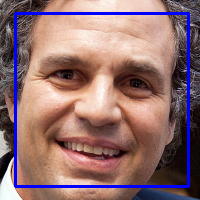

Broj detektovanih lica: 1
Vreme izvršenja: 0.04 sekundi


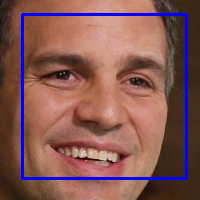

Broj detektovanih lica: 1
Vreme izvršenja: 0.05 sekundi


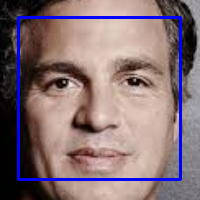

Broj detektovanih lica: 1
Vreme izvršenja: 0.06 sekundi


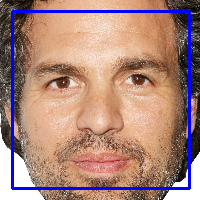

Broj detektovanih lica: 1
Vreme izvršenja: 0.06 sekundi


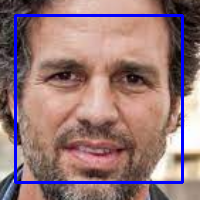

Broj detektovanih lica: 1
Vreme izvršenja: 0.05 sekundi


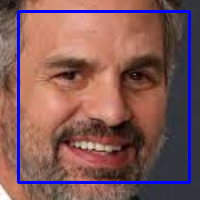

Broj detektovanih lica: 1
Vreme izvršenja: 0.05 sekundi


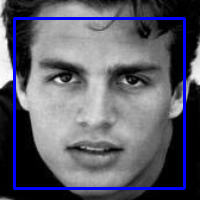

Broj detektovanih lica: 1
Vreme izvršenja: 0.05 sekundi


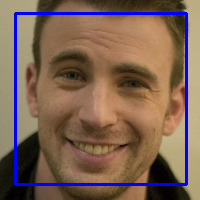

Broj detektovanih lica: 1
Vreme izvršenja: 0.04 sekundi


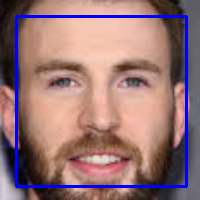

Broj detektovanih lica: 1
Vreme izvršenja: 0.04 sekundi


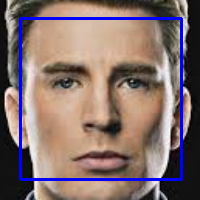

Broj detektovanih lica: 1
Vreme izvršenja: 0.04 sekundi


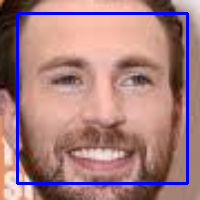

Broj detektovanih lica: 1
Vreme izvršenja: 0.04 sekundi


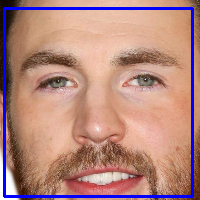

Broj detektovanih lica: 1
Vreme izvršenja: 0.03 sekundi


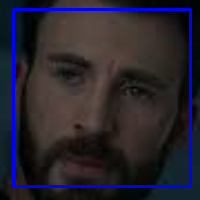

Broj detektovanih lica: 1
Vreme izvršenja: 0.02 sekundi


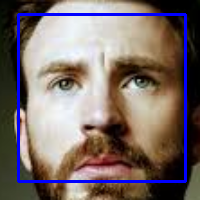

Broj detektovanih lica: 1
Vreme izvršenja: 0.04 sekundi


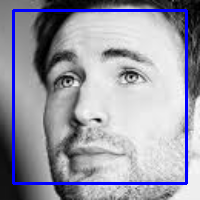

Broj detektovanih lica: 1
Vreme izvršenja: 0.04 sekundi


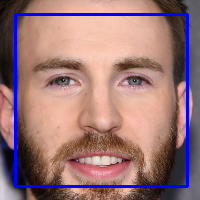

Broj detektovanih lica: 1
Vreme izvršenja: 0.03 sekundi


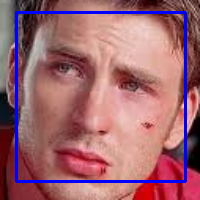

Broj detektovanih lica: 1
Vreme izvršenja: 0.05 sekundi


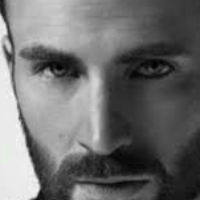

Broj detektovanih lica: 0
Vreme izvršenja: 0.03 sekundi


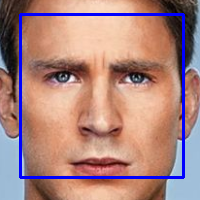

Broj detektovanih lica: 1
Vreme izvršenja: 0.06 sekundi


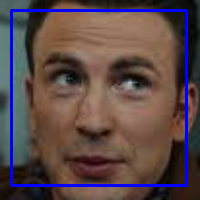

Broj detektovanih lica: 1
Vreme izvršenja: 0.04 sekundi


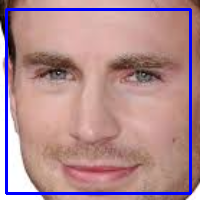

Broj detektovanih lica: 1
Vreme izvršenja: 0.03 sekundi


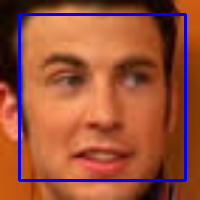

Broj detektovanih lica: 1
Vreme izvršenja: 0.05 sekundi


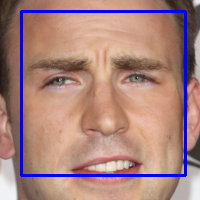

Broj detektovanih lica: 1
Vreme izvršenja: 0.06 sekundi


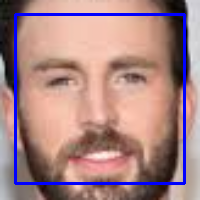

Broj detektovanih lica: 1
Vreme izvršenja: 0.04 sekundi


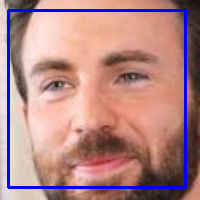

Broj detektovanih lica: 1
Vreme izvršenja: 0.04 sekundi


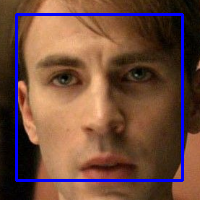

Broj detektovanih lica: 1
Vreme izvršenja: 0.04 sekundi


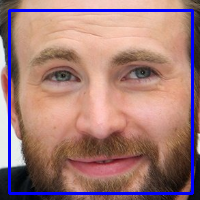

Broj detektovanih lica: 1
Vreme izvršenja: 0.04 sekundi


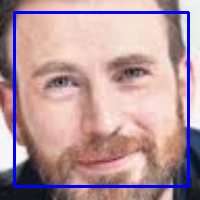

Broj detektovanih lica: 1
Vreme izvršenja: 0.04 sekundi


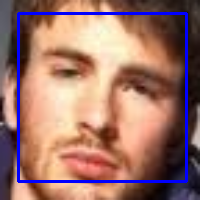

Broj detektovanih lica: 1
Vreme izvršenja: 0.05 sekundi


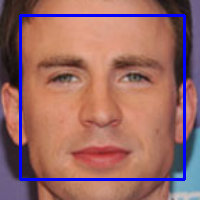

Broj detektovanih lica: 1
Vreme izvršenja: 0.05 sekundi


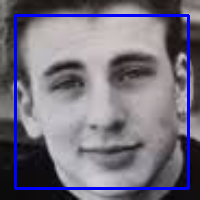

Broj detektovanih lica: 1
Vreme izvršenja: 0.05 sekundi


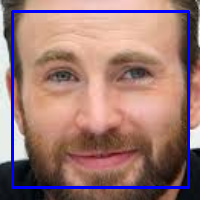

Broj detektovanih lica: 1
Vreme izvršenja: 0.03 sekundi


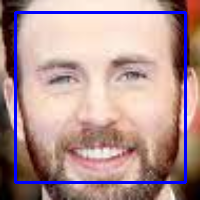

Broj detektovanih lica: 1
Vreme izvršenja: 0.04 sekundi


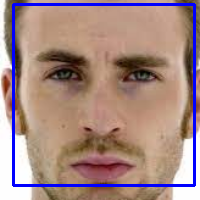

Broj detektovanih lica: 1
Vreme izvršenja: 0.04 sekundi


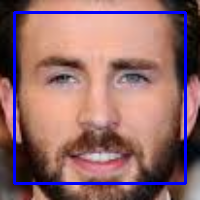

Broj detektovanih lica: 1
Vreme izvršenja: 0.04 sekundi


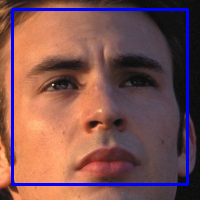

Broj detektovanih lica: 1
Vreme izvršenja: 0.05 sekundi


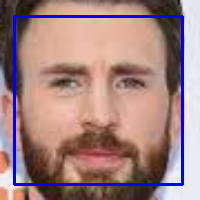

Broj detektovanih lica: 1
Vreme izvršenja: 0.05 sekundi


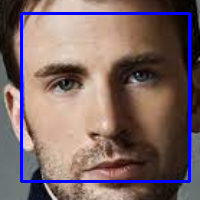

Broj detektovanih lica: 1
Vreme izvršenja: 0.05 sekundi


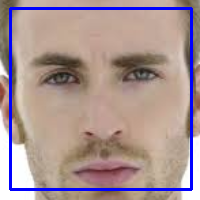

Broj detektovanih lica: 1
Vreme izvršenja: 0.04 sekundi


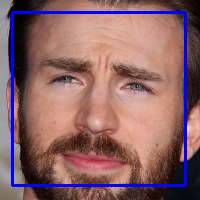

Broj detektovanih lica: 1
Vreme izvršenja: 0.06 sekundi


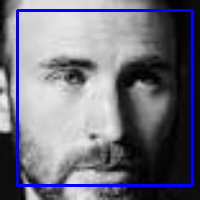

Broj detektovanih lica: 1
Vreme izvršenja: 0.05 sekundi


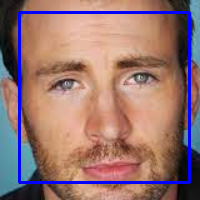

Broj detektovanih lica: 1
Vreme izvršenja: 0.06 sekundi


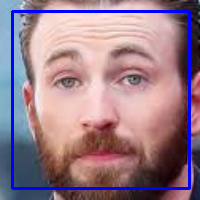

Broj detektovanih lica: 1
Vreme izvršenja: 0.04 sekundi


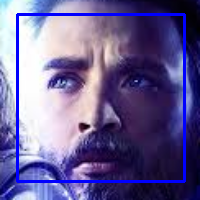

Broj detektovanih lica: 1
Vreme izvršenja: 0.04 sekundi


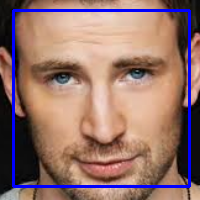

Broj detektovanih lica: 1
Vreme izvršenja: 0.05 sekundi


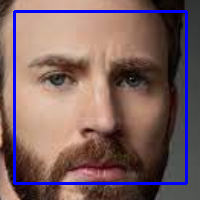

Broj detektovanih lica: 1
Vreme izvršenja: 0.05 sekundi


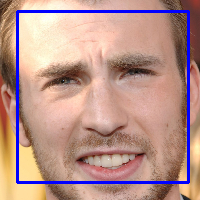

Broj detektovanih lica: 1
Vreme izvršenja: 0.04 sekundi


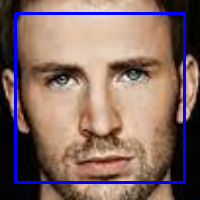

Broj detektovanih lica: 1
Vreme izvršenja: 0.04 sekundi


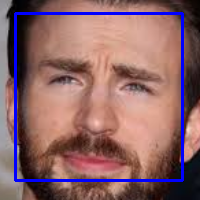

Broj detektovanih lica: 1
Vreme izvršenja: 0.04 sekundi


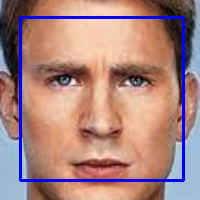

Broj detektovanih lica: 1
Vreme izvršenja: 0.04 sekundi


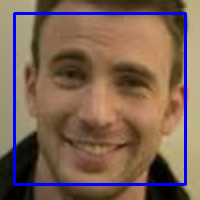

Broj detektovanih lica: 1
Vreme izvršenja: 0.04 sekundi


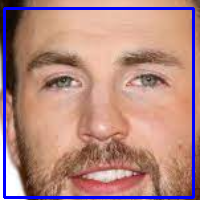

Broj detektovanih lica: 1
Vreme izvršenja: 0.06 sekundi


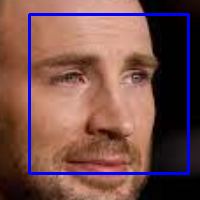

Broj detektovanih lica: 1
Vreme izvršenja: 0.04 sekundi


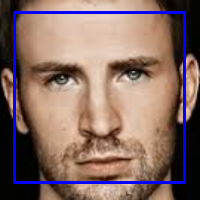

Broj detektovanih lica: 1
Vreme izvršenja: 0.05 sekundi


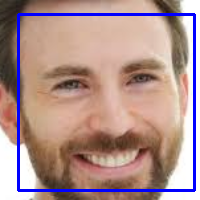

Broj detektovanih lica: 1
Vreme izvršenja: 0.03 sekundi


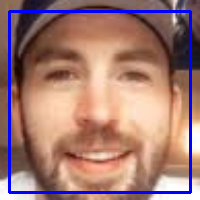

Broj detektovanih lica: 1
Vreme izvršenja: 0.05 sekundi


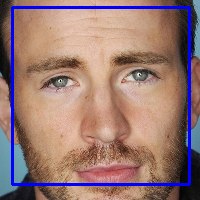

Broj detektovanih lica: 1
Vreme izvršenja: 0.05 sekundi


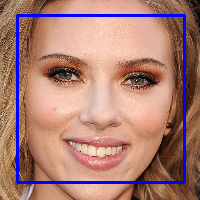

Broj detektovanih lica: 1
Vreme izvršenja: 0.04 sekundi


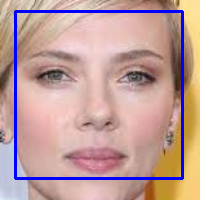

Broj detektovanih lica: 1
Vreme izvršenja: 0.04 sekundi


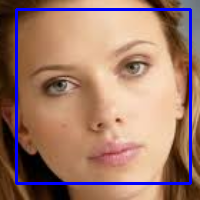

Broj detektovanih lica: 1
Vreme izvršenja: 0.04 sekundi


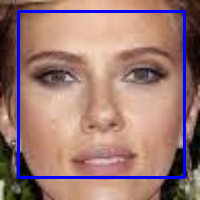

Broj detektovanih lica: 1
Vreme izvršenja: 0.05 sekundi


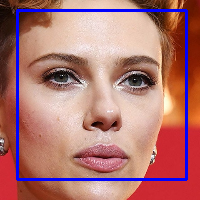

Broj detektovanih lica: 1
Vreme izvršenja: 0.05 sekundi


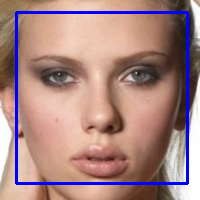

Broj detektovanih lica: 1
Vreme izvršenja: 0.04 sekundi


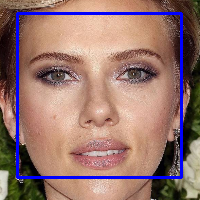

Broj detektovanih lica: 1
Vreme izvršenja: 0.11 sekundi


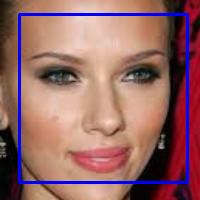

Broj detektovanih lica: 1
Vreme izvršenja: 0.08 sekundi


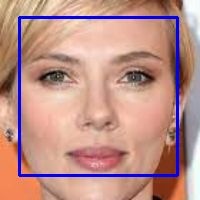

Broj detektovanih lica: 1
Vreme izvršenja: 0.08 sekundi


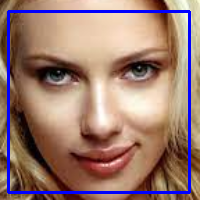

Broj detektovanih lica: 1
Vreme izvršenja: 0.05 sekundi


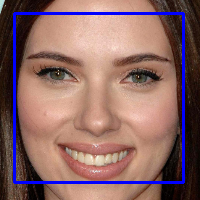

Broj detektovanih lica: 1
Vreme izvršenja: 0.07 sekundi


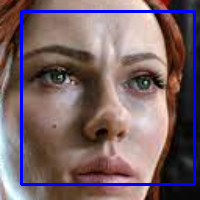

Broj detektovanih lica: 1
Vreme izvršenja: 0.07 sekundi


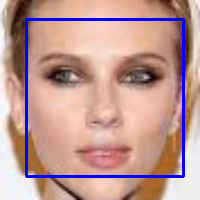

Broj detektovanih lica: 1
Vreme izvršenja: 0.05 sekundi


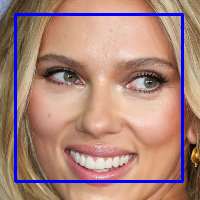

Broj detektovanih lica: 1
Vreme izvršenja: 0.05 sekundi


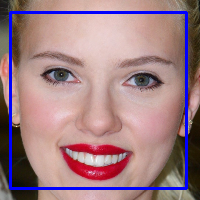

Broj detektovanih lica: 1
Vreme izvršenja: 0.07 sekundi


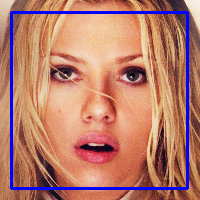

Broj detektovanih lica: 1
Vreme izvršenja: 0.10 sekundi


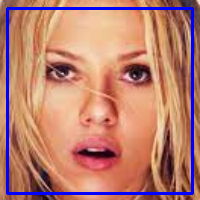

Broj detektovanih lica: 1
Vreme izvršenja: 0.06 sekundi


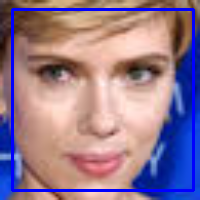

Broj detektovanih lica: 1
Vreme izvršenja: 0.07 sekundi


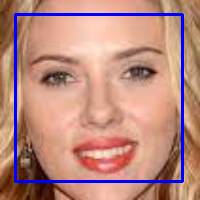

Broj detektovanih lica: 1
Vreme izvršenja: 0.08 sekundi


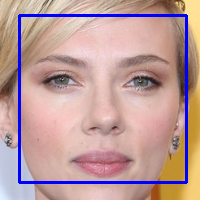

Broj detektovanih lica: 1
Vreme izvršenja: 0.07 sekundi


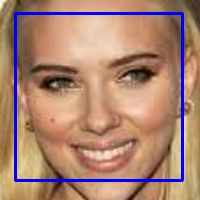

Broj detektovanih lica: 1
Vreme izvršenja: 0.08 sekundi


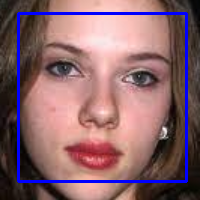

Broj detektovanih lica: 1
Vreme izvršenja: 0.07 sekundi


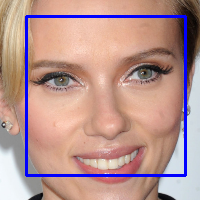

Broj detektovanih lica: 1
Vreme izvršenja: 0.13 sekundi


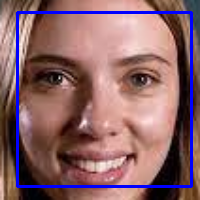

Broj detektovanih lica: 1
Vreme izvršenja: 0.10 sekundi


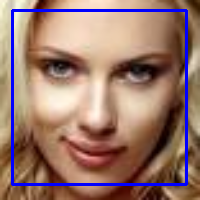

Broj detektovanih lica: 1
Vreme izvršenja: 0.06 sekundi


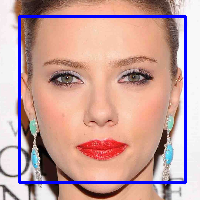

Broj detektovanih lica: 1
Vreme izvršenja: 0.06 sekundi


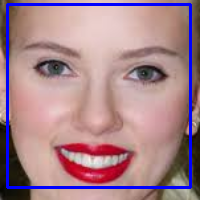

Broj detektovanih lica: 1
Vreme izvršenja: 0.07 sekundi


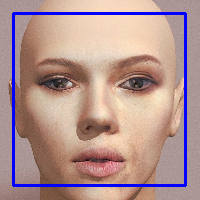

Broj detektovanih lica: 1
Vreme izvršenja: 0.09 sekundi


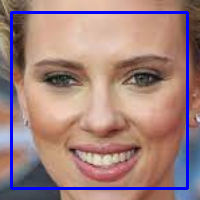

Broj detektovanih lica: 1
Vreme izvršenja: 0.06 sekundi


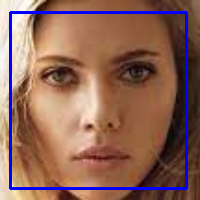

Broj detektovanih lica: 1
Vreme izvršenja: 0.07 sekundi


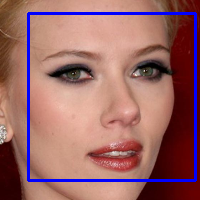

Broj detektovanih lica: 1
Vreme izvršenja: 0.05 sekundi


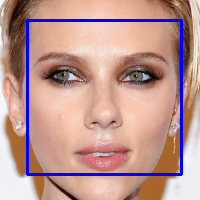

Broj detektovanih lica: 1
Vreme izvršenja: 0.06 sekundi


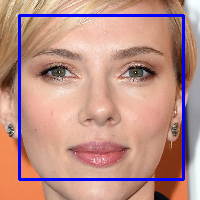

Broj detektovanih lica: 1
Vreme izvršenja: 0.06 sekundi


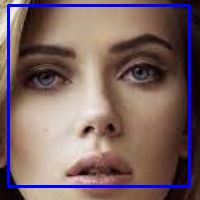

Broj detektovanih lica: 1
Vreme izvršenja: 0.10 sekundi


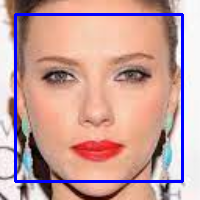

Broj detektovanih lica: 1
Vreme izvršenja: 0.08 sekundi


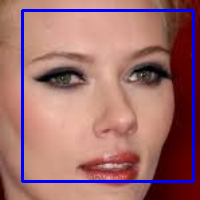

Broj detektovanih lica: 1
Vreme izvršenja: 0.05 sekundi


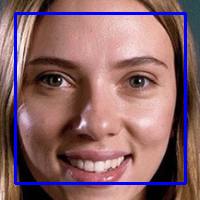

Broj detektovanih lica: 1
Vreme izvršenja: 0.11 sekundi


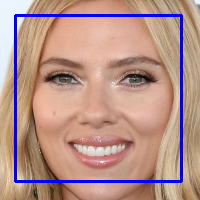

Broj detektovanih lica: 1
Vreme izvršenja: 0.06 sekundi


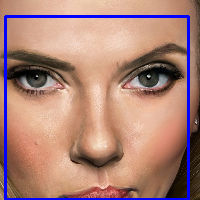

Broj detektovanih lica: 1
Vreme izvršenja: 0.08 sekundi


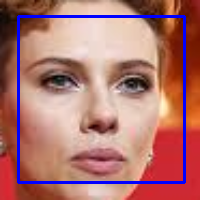

Broj detektovanih lica: 1
Vreme izvršenja: 0.06 sekundi


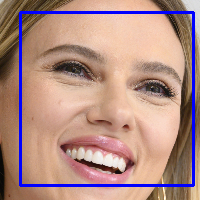

Broj detektovanih lica: 1
Vreme izvršenja: 0.08 sekundi


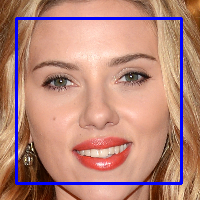

Broj detektovanih lica: 1
Vreme izvršenja: 0.10 sekundi


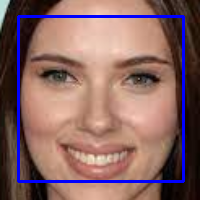

Broj detektovanih lica: 1
Vreme izvršenja: 0.10 sekundi


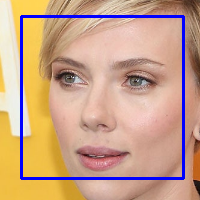

Broj detektovanih lica: 1
Vreme izvršenja: 0.07 sekundi


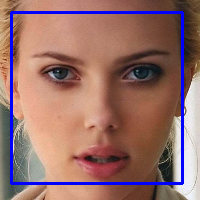

Broj detektovanih lica: 1
Vreme izvršenja: 0.07 sekundi


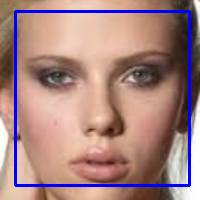

Broj detektovanih lica: 1
Vreme izvršenja: 0.06 sekundi


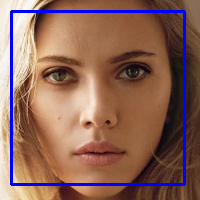

Broj detektovanih lica: 1
Vreme izvršenja: 0.06 sekundi


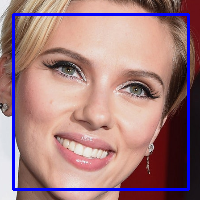

Broj detektovanih lica: 1
Vreme izvršenja: 0.09 sekundi


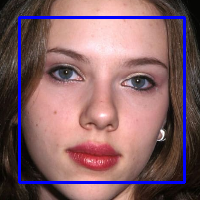

Broj detektovanih lica: 1
Vreme izvršenja: 0.10 sekundi


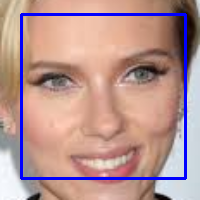

Broj detektovanih lica: 1
Vreme izvršenja: 0.06 sekundi


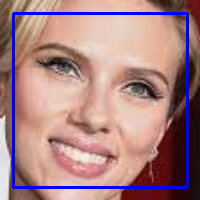

Broj detektovanih lica: 1
Vreme izvršenja: 0.08 sekundi


KeyboardInterrupt: 

In [ ]:
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

#Glavni folder
main_folder = "cropped_images"
# Prolazak kroz sve podfoldere u glavnom folderu
for subfolder in os.listdir(main_folder):
    # Kreiranje putanje do podfoldera
    subfolder_path = os.path.join(main_folder, subfolder)
    # Provera da li je putanja do podfoldera
    if not os.path.isdir(subfolder_path):
        print(f"Invalid subfolder path: {subfolder_path}")
        continue
    # Prolazak kroz sve slike u podfolderu
    for filename in os.listdir(subfolder_path):
        # Kreiranje putanje do slike
        img_path = os.path.join(subfolder_path, filename)
        # Provera da li putanja vodi do fajla
        if not os.path.isfile(img_path):
            print(f"Invalid image path: {img_path}")
            continue

        # Učitavanje slike
        img = cv2.imread(img_path)
        #Nove dimenzije
        new_width = 200
        new_height = 200
        # Promena velicine slike
        resized_img = cv2.resize(img, (new_width, new_height))

        #Konvertovanje u crno-belu boju
        gray = cv2.cvtColor(resized_img, cv2.COLOR_BGR2GRAY)
        # Detekcija lica na preuzetoj slici
        start_time = time.time()
        faces = face_cascade.detectMultiScale(gray, 1.1, 4)
        haar_time = time.time() - start_time
        # Crtanje okvira(pravougaonika) oko prepoznatih lica
        for (x, y, w, h) in faces:
            cv2.rectangle(resized_img, (x, y), (x+w, y+h), (255, 0, 0), 2)
        # Prikaz slike
        cv2_imshow(resized_img)
        cv2.waitKey(0)
        #Ispis rezultata:
        print(f"Broj detektovanih lica: {len(faces)}")
        print(f"Vreme izvršenja: {haar_time:.2f} sekundi")
# Zatvaranje prozora nakon prikaza svih slika
cv2.destroyAllWindows()


In [ ]:
pip install dlib

In [ ]:
import dlib

In [ ]:
detector = dlib.get_frontal_face_detector()


In [ ]:
!pip install cv2_imshow

HOG karakteristike


HOG (Histogram of Oriented Gradients) karakteristike su popularna tehnika za detekciju objekata u digitalnim slikama.
HOG karakteristike predstavljaju globalne teksturalne informacije u slici, posebno informacije o ivicama i teksturi objekata.
Osnovna ideja je da se slika podeli na male regione, a zatim se za svaki region izračuna histogram orijentisanih gradijenata.
Orijentisani gradijenti se koriste za opisivanje promena svetline u slici. Gradijenti su vektori koji pokazuju smer najvećeg porasta svetline.
Za svaki piksel u regionu, izračunava se gradijent u odnosu na njegove susede.

Što se tiče detekcije detekcije objekata, HOG karakteristike se obično koriste sa klasičnim klasifikatorima kao što su Support Vector Machines (SVM) ili neuralne mreže za detekciju objekata. Obučavanjem klasifikatora na skupu slika koje sadrže i ne sadrže traženi objekat, može se postići detekcija tog objekta.
HOG karakteristike su često korišćene za detekciju objekata kao što su lica, pešaci, vozila, itd. Takođe se koriste u računarima za praćenje pokreta, segmentaciju slika, prepoznavanje gestikulacija i druge zadatke obrade slika.

Međutim, HOG karakteristike nisu uvek efikasne za detekciju objekata u složenim scenama ili u uslovima niskog osvetljenja.
Zahtevaju dobar skup trening podataka za obuku klasifikatora.


In [ ]:
detector = dlib.get_frontal_face_detector()

# Glavni folder
main_folder = "cropped_images"

# Prolazak kroz sve podfoldere u glavnom folderu
for subfolder in os.listdir(main_folder):
    # Kreiranje putanje do podfoldera
    subfolder_path = os.path.join(main_folder, subfolder)
    # Provera da li je putanja do podfoldera
    if not os.path.isdir(subfolder_path):
        print(f"Invalid subfolder path: {subfolder_path}")
        continue
    # Prolazak kroz sve slike u podfolderu
    for filename in os.listdir(subfolder_path):
        # Kreiranje putanje do slike
        img_path = os.path.join(subfolder_path, filename)
        # Provera da li putanja vodi do fajla
        if not os.path.isfile(img_path):
            print(f"Invalid image path: {img_path}")
            continue

        # Učitavanje slike
        img = cv2.imread(img_path)
        #Nove dimenzije slike
        new_width = 150
        new_height = 150
        #Promenjena velicina slike
        resized_img = cv2.resize(img, (new_width, new_height))
        #Detekcija lica na preuzetoj slici
        start_time=time.time()
        faces = detector(resized_img)
        hog_time=time.time()-start_time
        #Crtanje okvira(pravougaonika) oko prepoznatog lica
        for face in faces:
          x, y, w, h = face.left(), face.top(), face.width(), face.height()
          cv2.rectangle(resized_img, (x, y), (x + w, y + h), (0, 255, 0), 2)
        #Prikaz slike
        import cv2
        cv2_imshow(resized_img)
        cv2.waitKey(0)
        #Ispis rezultata:
        print(f"Broj detektovanih lica: {len(faces)}")
        print(f"Vreme izvršenja: {hog_time:.2f} sekundi")
#Zatvaranje prozora nakon prikaza svih slika
cv2.destroyAllWindows()



MTCNN

MTCNN (Multi-task Cascaded Convolutional Networks) je efikasna i popularna metoda za detekciju lica u digitalnim slikama. MTCNN je popularan alat za preciznu i efikasnu detekciju lica i ključnih tačaka lica u različitim scenama i orijentacijama. Ova metoda se često koristi u širokom spektru aplikacija koje zahtevaju prepoznavanje lica.

MTCNN se sastoji od tri faze (kaskada) koje rade zajedno za detekciju lica.
Prva faza koristi brzi model za grubu detekciju regiona slika koji potencijalno sadrže lica.
Druga faza prilagođava granice detekcije i otkriva lokaciju lica tačnije.
Treća faza vrši još precizniju detekciju i identifikaciju ključnih tačaka lica (npr. nos, oči, usta).
MTCNN je posebno dizajniran za obavljanje višestrukih zadataka: grubu detekciju lica, precizniju detekciju lica i identifikaciju ključnih tačaka lica.
Ovo omogućava bržu i precizniju detekciju u odnosu na nekoliko pojedinačnih metoda.
U nastavku je prikazano detektovanje lica, kao i detekotovanje ključnih tačaka, a to su oči, nos, leva strana usta i desna strana usta.

In [ ]:
detector = MTCNN()
mtcnn_detector = MTCNN()

#Glavni folder
main_folder = "cropped_images"
# Prolazak kroz sve podfoldere u glavnom folderu
for subfolder in os.listdir(main_folder):
    subfolder_path = os.path.join(main_folder, subfolder)
    # Provera da li je putanja do podfoldera
    if not os.path.isdir(subfolder_path):
        print(f"Invalid subfolder path: {subfolder_path}")
        continue
    # Prolazak kroz sve slike u podfolderu
    for filename in os.listdir(subfolder_path):
        img_path = os.path.join(subfolder_path, filename)
        # Provera da li putanja vodi do fajla
        if not os.path.isfile(img_path):
            print(f"Invalid image path: {img_path}")
            continue

        # Učitavanje slike
        img = cv2.imread(img_path)
        #Nove dimenzije slike
        new_width = 200
        new_height = 200
        #Slika sa promenjenom velicinom
        resized_img = cv2.resize(img, (new_width, new_height))
        #Detekcija lica na preuzetoj slici
        start_time=time.time()
        detector = mtcnn_detector.detect_faces(resized_img)
        mtcnn_time=time.time()-start_time
        for result in detector:
          x, y, w, h = result['box']  # Koordinate lica
          landmarks = result['keypoints']  # Ključne tačke lica (nos, levo oko, desno oko, leva stranu usta, desna strana usta)
          # Crtanje pravougaonika oko lica
          cv2.rectangle(resized_img, (x, y), (x + w, y + h), (255, 0, 0), 2)
          # Crtanje tačaka za nos, levo oko, desno oko, levu stranu usta, desnu stranu usta
          for key, point in landmarks.items():
            cv2.circle(resized_img, point, 2, (0, 255, 0), -1)

          # Prikazivanje rezultata
          cv2_imshow(resized_img)
          cv2.waitKey(0)
          cv2.destroyAllWindows()

          #Ispis rezultata:
          print(f"Broj detektovanih lica: {len(detector)}")
          print(f"Vreme izvršenja: {mtcnn_time:.2f} sekundi")


Evaluacija rezultata


Upoređivanje metoda za detekciju lica je važan korak u odabiru odgovarajuće metode za specifičan problem ili projekat.
Među njima se izdvajaju tačnost detekcije, brzina izvršavanja, resursi i hardver, fleksibilnost i prilagodljivost i slično.

U ovom projektu fokus je bio na brzini izvršavanja. To je urađeno pomoću biblioteke time i uvođenja promenljive start'time, kako bi se odredilo početno vreme. Ovo je važno ukoliko se obrađuje velika količina slika i vrši se detekcija na svakoj od njih.

Što se tiče modela HaarCascade i HOG karakteristika, vreme izvršavanja kod HOG karakteristika je kraće, najviše 0.06s po slici. U tom slučaju prednost može se dati ovoj metodi. Takođe, ova metoda na pojedinim slikama detektovala je više od 1 lica.

MTCCN uključuje i detektovanje ključnih tačaka na samom licu(oči, nos i usta) i zbog toga je bilo potrebno znatno više vremena za izvršavanje, negde čak i preko 1 sekunde.

Zaključak


Ovaj projektni zadatak predstavlja samo deo šire oblasti detekcije lica.
Prilikom izrade projekta fokus je bio na korišćenju HaarCascade, zatim HOG karakteristika i MTCNN alata. Metode su se mogle uporediti po brzini izvršavanja. Kao što se moglo videti, mala količina koda je potrebna kako bi se detektovalo samo lice.

Reference:
1. https://www.techtarget.com/searchenterpriseai/definition/face-detection

2. https://docs.opencv.org/3.4/db/d28/tutorial_cascade_classifier.html

3. https://pyimagesearch.com/2021/04/19/face-detection-with-dlib-hog-and-cnn/

4. https://medium.com/@saranshrajput/face-detection-using-mtcnn-f3948e5d1acb